# Predict İmages & See Result

In [1]:
#inference graph in train notebook- faster-rcnn

In [1]:
#import packages
import io
import os
import scipy.misc
import numpy as np
import six
import time
import glob
from IPython.display import display
import cv2
from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont,ImageColor


import tensorflow as tf
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

In [2]:
labelmap_path = 'training/labelmap.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)

In [3]:
tf.keras.backend.clear_session()
model = tf.saved_model.load('model/inference_graph/saved_model')

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [4]:
def load_image_into_numpy_array(path):

    img_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(img_data))
    
    (im_width, im_height) = image.size
    img =  np.array(image.getdata())
    #print(img,img.shape)
    return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)
    #return .astype(np.uint8)

In [5]:
def run_inference_for_single_image(model, image):
    image = np.asarray(image)
    input_tensor = tf.convert_to_tensor(image)

    input_tensor = input_tensor[tf.newaxis,...]

    # Run inference
    model_fn = model.signatures['serving_default']
    output_dict = model_fn(input_tensor)

    num_detections = int(output_dict.pop('num_detections'))

    output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}

    output_dict['num_detections'] = num_detections


    output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
    
  
    if 'detection_masks' in output_dict:
    
    
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                  output_dict['detection_masks'], output_dict['detection_boxes'],
                   image.shape[0], image.shape[1])
        print(detection_masks_reframed)
        detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                           tf.uint8)
        output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

    return output_dict

## Results with My Own Photos

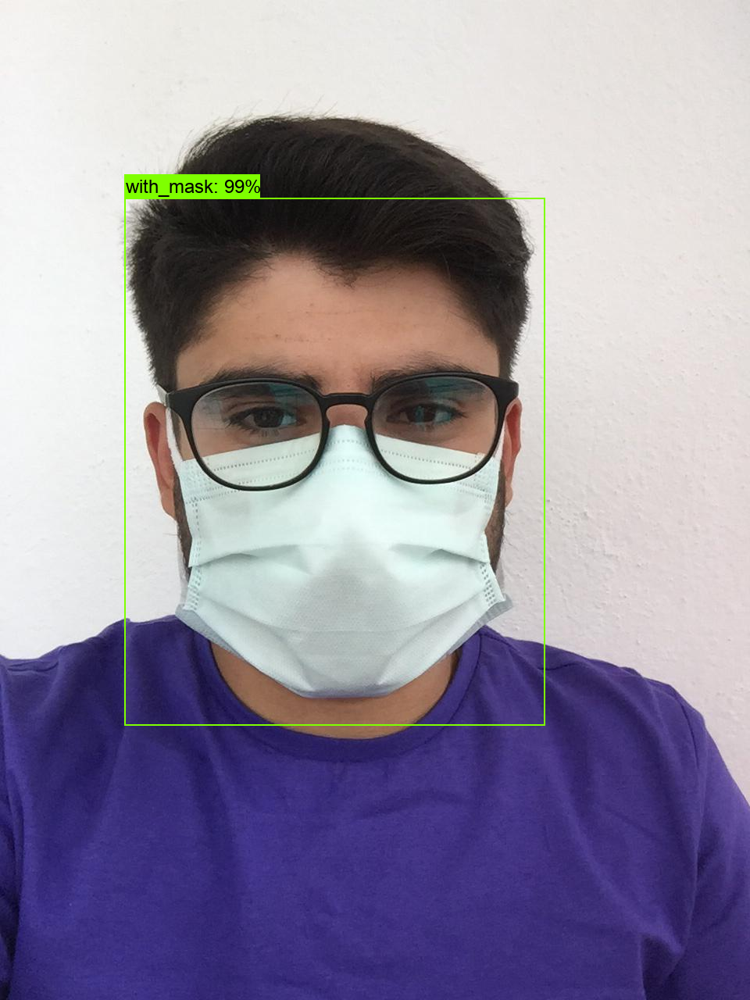

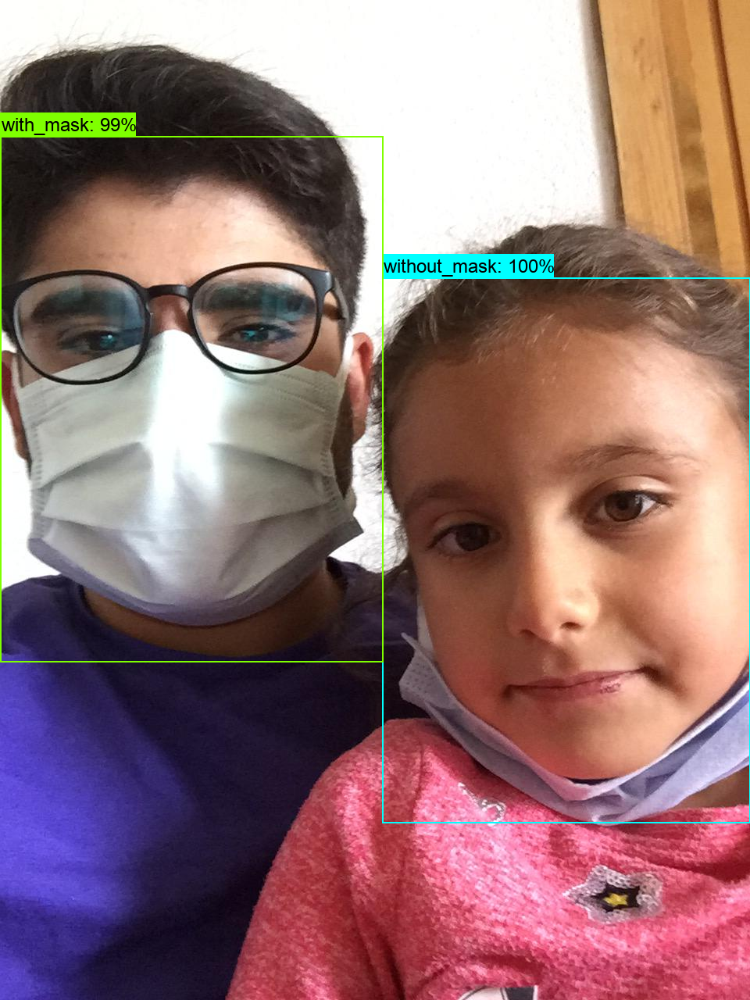

In [6]:
for i,image_path in enumerate(glob.glob('images/Validation_Set-Images/my_images/*.png')):


    image_np = load_image_into_numpy_array(image_path)
    output_dict = run_inference_for_single_image(model, image_np)
    vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=2,
      min_score_thresh=0.90)
    display(Image.fromarray(image_np))
    

## Results with Stock Photos

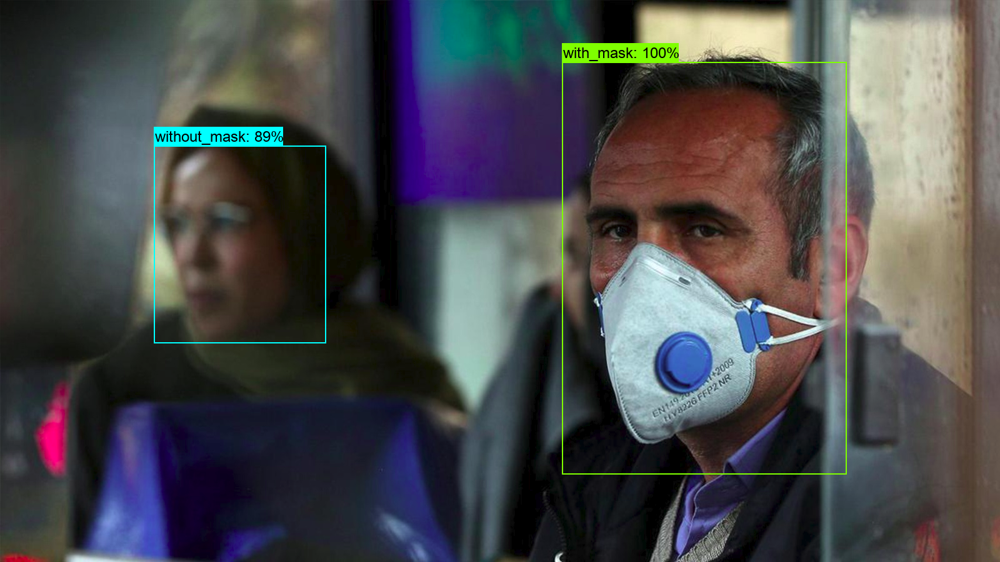

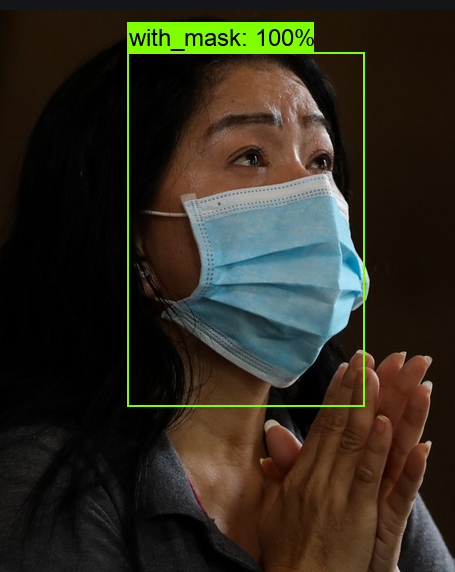

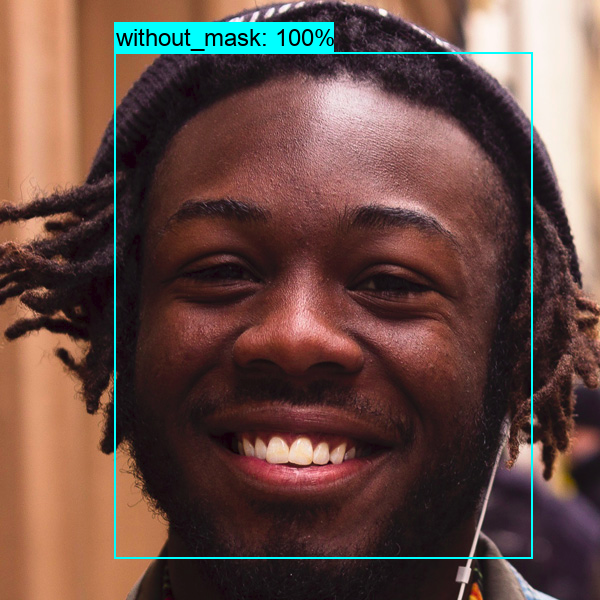

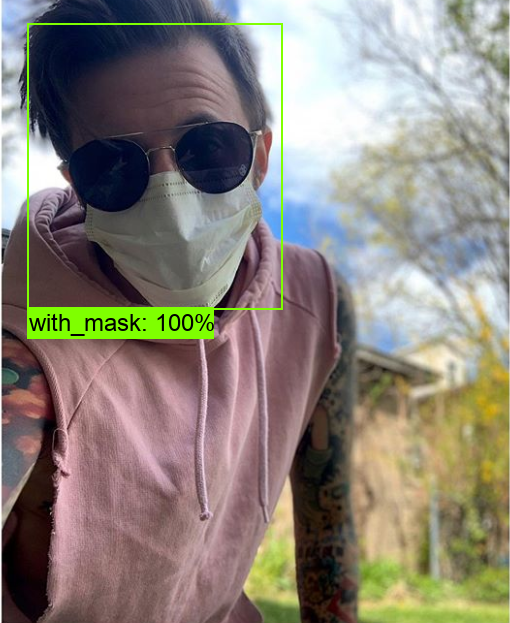

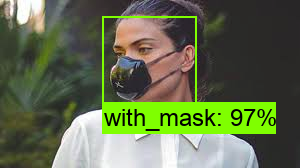

...

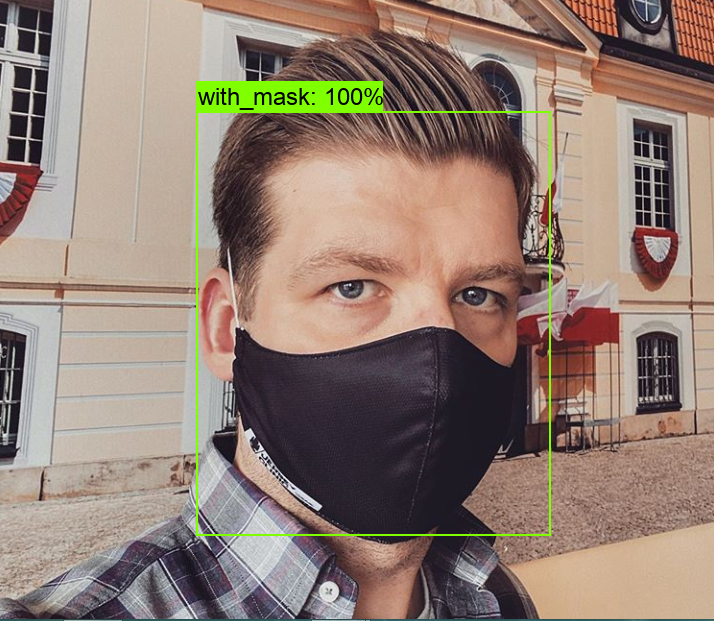

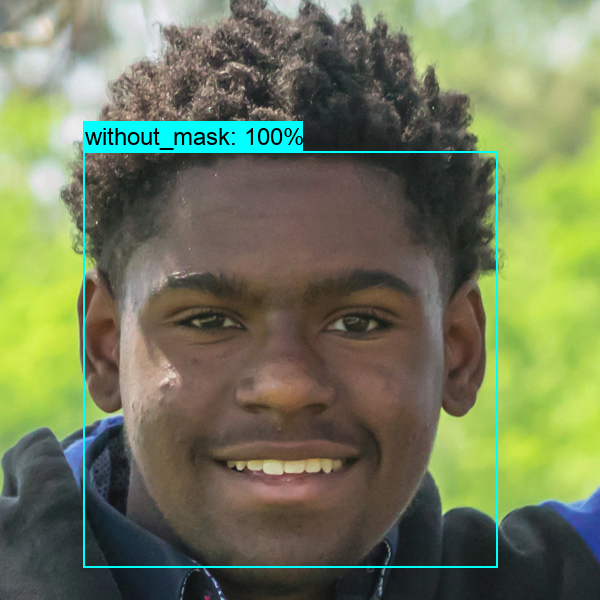

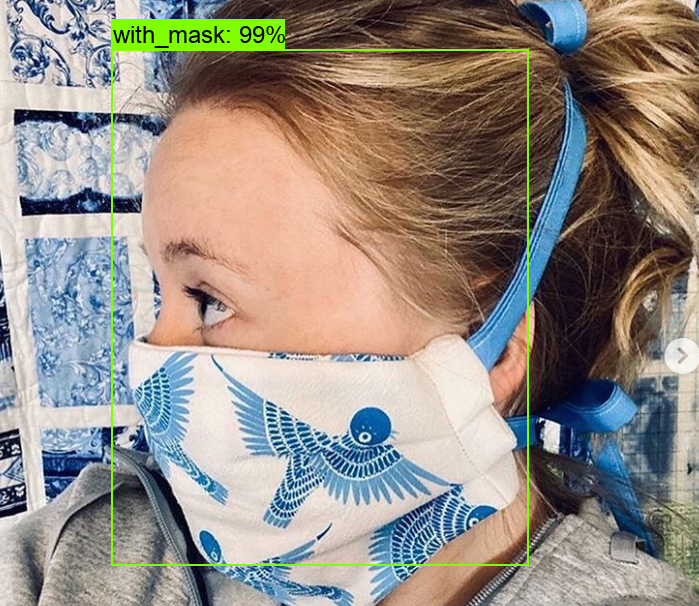

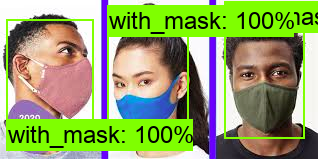

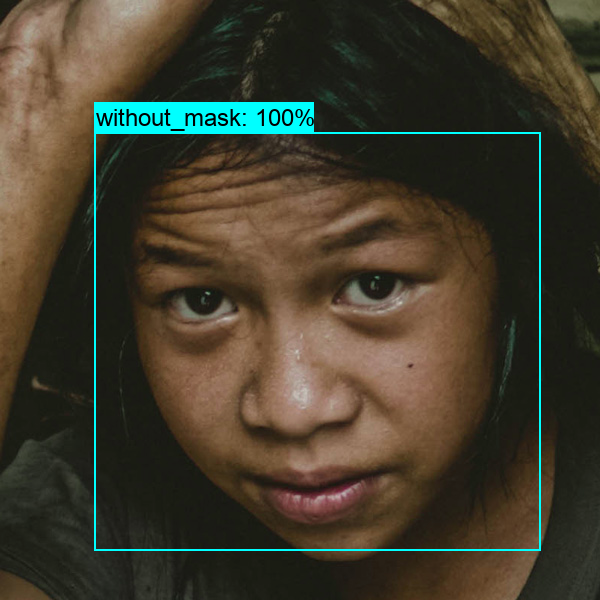

In [7]:
for i,image_path in enumerate(glob.glob('images/Validation_Set-Images/images/*.png')):


    image_np = load_image_into_numpy_array(image_path)
    output_dict = run_inference_for_single_image(model, image_np)
    vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=2,
      min_score_thresh=0.70)
    display(Image.fromarray(image_np))
 